# **Important Libraries**

In [1]:
# model library
!pip install -q Pillow
!pip install -q torch
!pip install -q torchvision
!pip install -q transformers
!pip install -q sentencepiece
!pip install -q accelerate
!pip install -q bitsandbytes


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 MB 8.8 MB/s eta 0:00:00


In [2]:
!pip install PyMuPDF

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.8/19.8 MB 56.8 MB/s eta 0:00:00


In [3]:
!pip install Flask-Caching

In [4]:
!pip install pdf2image

# **PDF UPLOADING**

# **PDF CROPPING**

In [5]:
!pip install PyPDF2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 7.1 MB/s eta 0:00:00


In [7]:
import fitz  # PyMuPDF
from PIL import Image
import os
import shutil
from google.colab import files

def pdf_to_images(output_folder="PDF_Images"):
    """
    Converts an uploaded PDF to images (one per page), saved in the specified output folder.

    Args:
    output_folder (str): Folder where the images will be saved. Defaults to "PDF_Images".

    Returns:
    tuple: (int, str) - Total page count and output folder path if successful, else (None, None).
    """
    # Upload the PDF file
    uploaded = files.upload()

    # Check if a file was uploaded
    if not uploaded:
        print("No file uploaded. Exiting function.")
        return None, None

    # Get the uploaded file path
    pdf_path = list(uploaded.keys())[0]
    print(f"Processing file: {pdf_path}")

    try:
        # Initialize page count
        pg_no = 0

        # Open the PDF file
        pdf_document = fitz.open(pdf_path)

        # Ensure the output folder exists and is empty
        if os.path.exists(output_folder):
            shutil.rmtree(output_folder)
        os.makedirs(output_folder)

        # Loop through each page in the PDF
        for page_number in range(pdf_document.page_count):
            pg_no += 1  # Increment the page number

            # Select the page and render it as a pixmap
            page = pdf_document.load_page(page_number)
            pix = page.get_pixmap()

            # Convert the pixmap to an image
            img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

            # Save the image in the output folder
            img_path = os.path.join(output_folder, f"page_{page_number + 1}.png")
            img.save(img_path)
            print(f"Saved page {page_number + 1} as image: {img_path}")

        # Close the PDF document
        pdf_document.close()

        print(f"\nTotal pages converted to images: {pg_no}")
        return pg_no, output_folder

    except Exception as e:
        print("An error occurred during PDF processing:", e)
        return None, None

# Example usage in Colab
if __name__ == "__main__":
    result = pdf_to_images()
    if result[0] is not None:
        print("\nTotal Page Count:", result[0])  # Total page count
        print("Output Path for Images:", result[1])  # Output folder path
    else:
        print("PDF processing was not completed.")


Saving SAMPLE.pdf to SAMPLE.pdf
Processing file: SAMPLE.pdf
Saved page 1 as image: PDF_Images/page_1.png
Saved page 2 as image: PDF_Images/page_2.png
Saved page 3 as image: PDF_Images/page_3.png
Saved page 4 as image: PDF_Images/page_4.png
Saved page 5 as image: PDF_Images/page_5.png
Saved page 6 as image: PDF_Images/page_6.png

Total pages converted to images: 6

Total Page Count: 6
Output Path for Images: PDF_Images


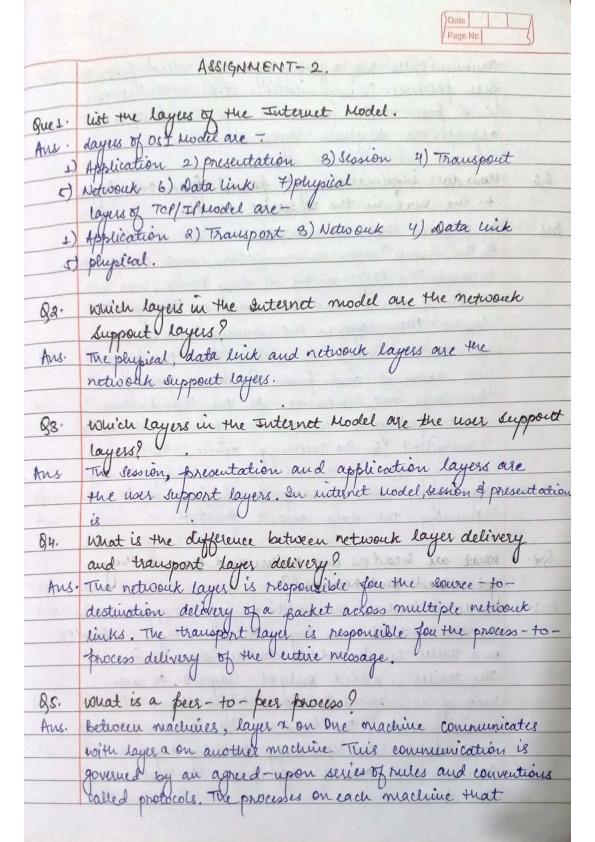

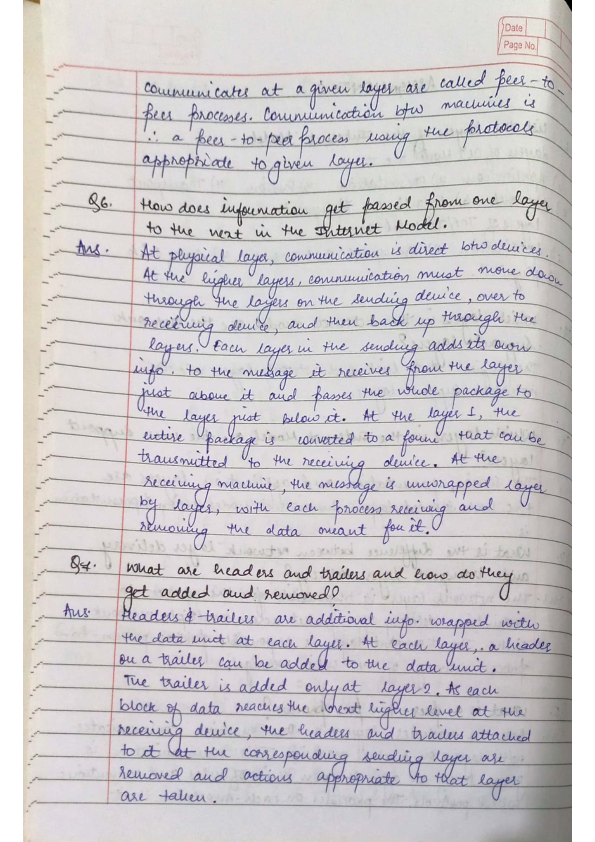

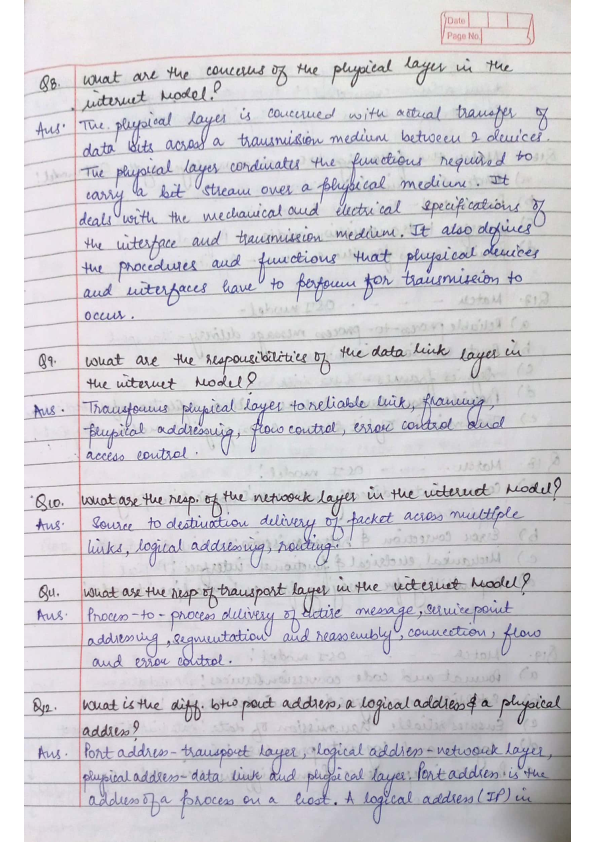

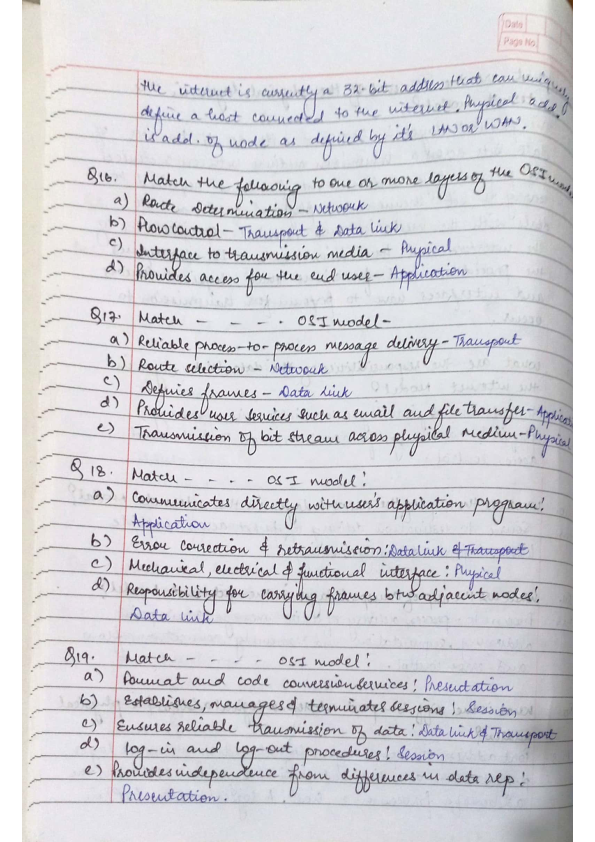

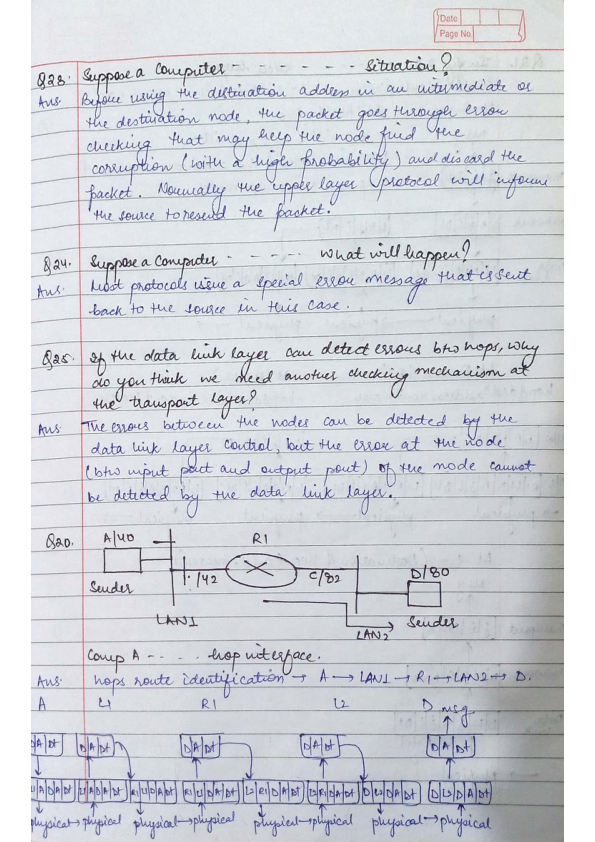

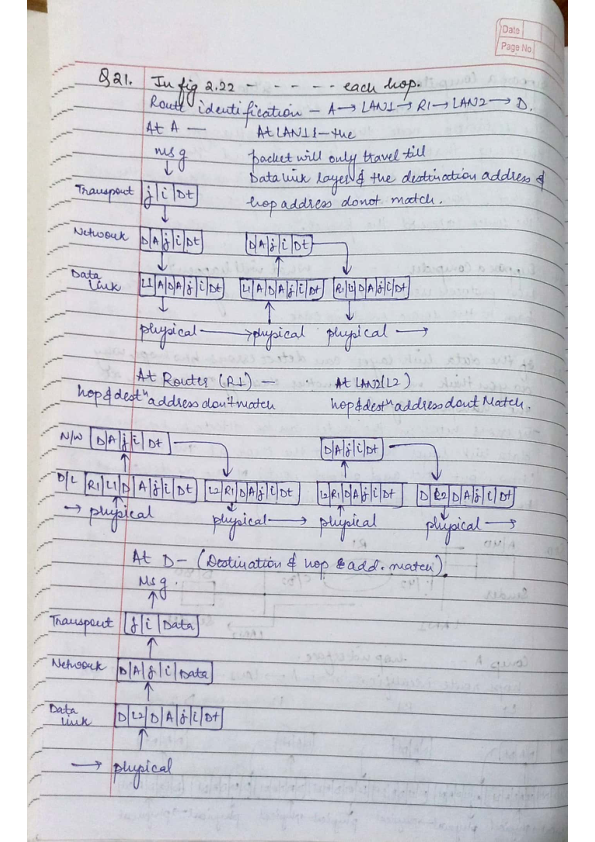

Displayed image: PDF_Images/page_1.png
Displayed image: PDF_Images/page_2.png
Displayed image: PDF_Images/page_3.png
Displayed image: PDF_Images/page_4.png
Displayed image: PDF_Images/page_5.png
Displayed image: PDF_Images/page_6.png


In [8]:
import glob
from IPython.display import Image, display

# Folder where images were saved
output_folder = "PDF_Images"

# Get a list of all image files in the output folder
image_files = glob.glob(os.path.join(output_folder, '*.png'))

# Check if there are any images
if not image_files:
    print(f"No images found in {output_folder}.")
else:
    # Display each image, sorted by filename to maintain page order
    for image_file in sorted(image_files):  # Sorting ensures pages are displayed in order
        display(Image(filename=image_file))
        print(f"Displayed image: {image_file}")


# **PDF CROPPING ALGORITHM (RLSA)**

Processing image: /content/PDF_Images/page_2.png
Paragraph: (0, 69, 595, 550)
Paragraph: (0, 548, 595, 842)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg


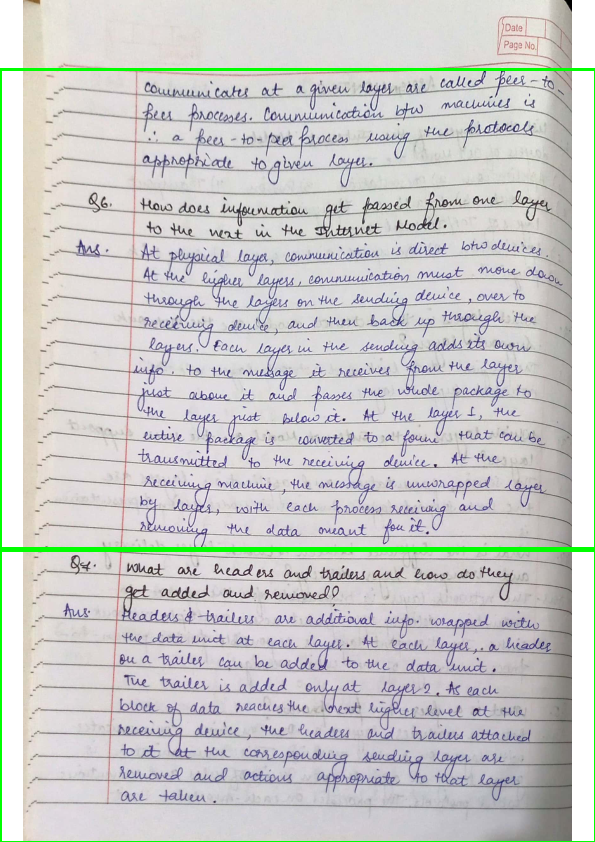

Processing image: /content/PDF_Images/page_4.png
Paragraph: (142, 73, 595, 158)
Paragraph: (0, 164, 595, 296)
Paragraph: (0, 307, 595, 458)
Paragraph: (0, 458, 595, 623)
Paragraph: (0, 642, 595, 842)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg
Cropped paragraph 3 saved at cropped_paragraphs/paragraph_3.jpg
Cropped paragraph 4 saved at cropped_paragraphs/paragraph_4.jpg
Cropped paragraph 5 saved at cropped_paragraphs/paragraph_5.jpg
Horizontal gap between paragraph 2 and 3: 11 pixels
Horizontal gap between paragraph 4 and 5: 19 pixels


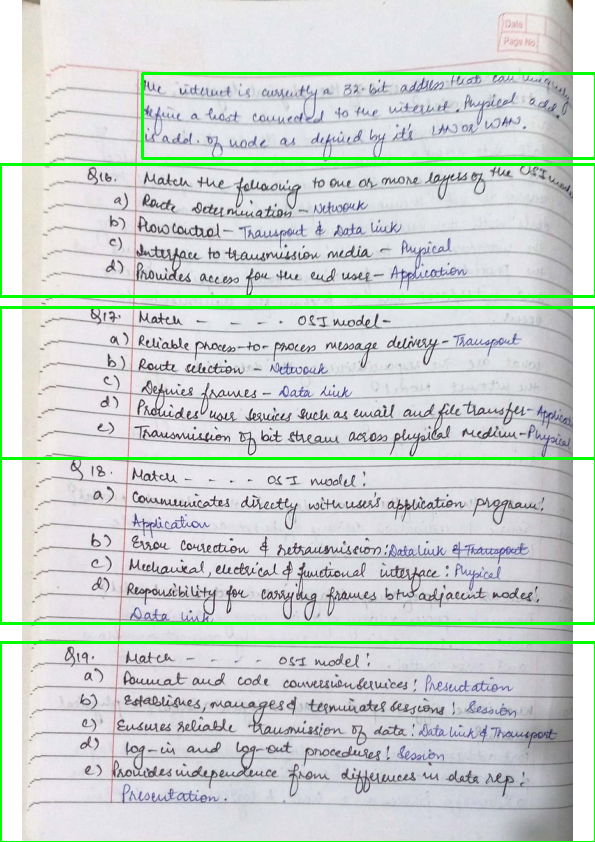

Processing image: /content/PDF_Images/page_3.png
Paragraph: (0, 57, 595, 111)
Paragraph: (0, 105, 595, 306)
Paragraph: (0, 311, 133, 320)
Paragraph: (0, 340, 595, 461)
Paragraph: (0, 477, 595, 568)
Paragraph: (0, 573, 595, 669)
Paragraph: (0, 675, 595, 842)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg
Cropped paragraph 3 saved at cropped_paragraphs/paragraph_3.jpg
Cropped paragraph 4 saved at cropped_paragraphs/paragraph_4.jpg
Cropped paragraph 5 saved at cropped_paragraphs/paragraph_5.jpg
Cropped paragraph 6 saved at cropped_paragraphs/paragraph_6.jpg
Cropped paragraph 7 saved at cropped_paragraphs/paragraph_7.jpg
Horizontal gap between paragraph 3 and 4: 20 pixels
Horizontal gap between paragraph 4 and 5: 16 pixels


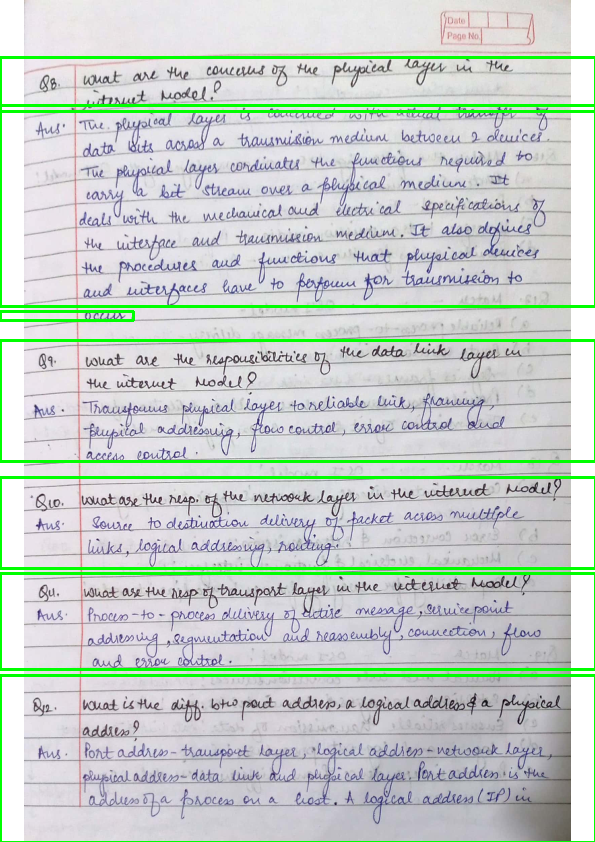

Processing image: /content/PDF_Images/page_6.png
Paragraph: (553, 0, 595, 47)
Paragraph: (0, 68, 595, 744)
Paragraph: (498, 662, 595, 673)
Paragraph: (0, 748, 237, 797)
Paragraph: (466, 805, 595, 842)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg
Cropped paragraph 3 saved at cropped_paragraphs/paragraph_3.jpg
Cropped paragraph 4 saved at cropped_paragraphs/paragraph_4.jpg
Cropped paragraph 5 saved at cropped_paragraphs/paragraph_5.jpg
Horizontal gap between paragraph 1 and 2: 21 pixels
Horizontal gap between paragraph 3 and 4: 75 pixels


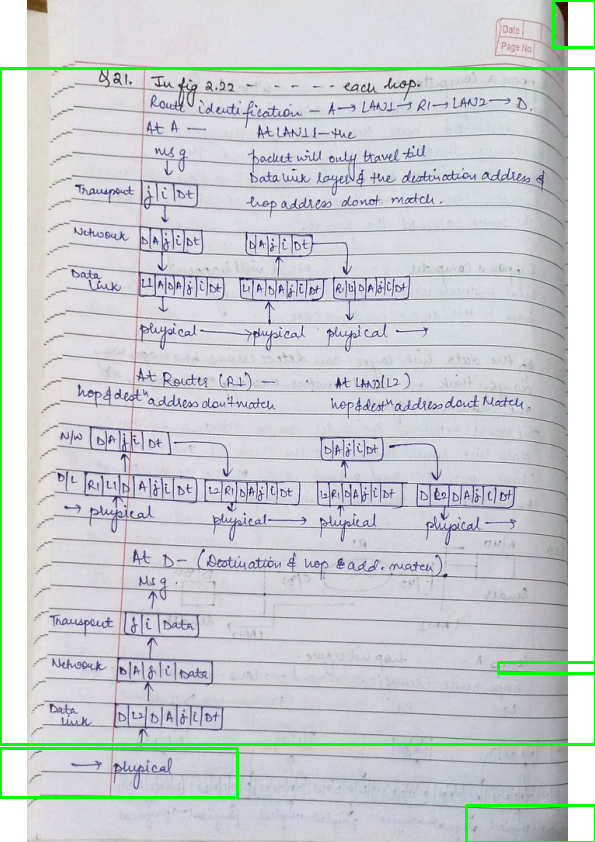

Processing image: /content/PDF_Images/page_1.png
Paragraph: (199, 60, 327, 75)
Paragraph: (0, 105, 595, 281)
Paragraph: (0, 291, 595, 402)
Paragraph: (0, 405, 595, 681)
Paragraph: (0, 689, 595, 815)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg
Cropped paragraph 3 saved at cropped_paragraphs/paragraph_3.jpg
Cropped paragraph 4 saved at cropped_paragraphs/paragraph_4.jpg
Cropped paragraph 5 saved at cropped_paragraphs/paragraph_5.jpg
Horizontal gap between paragraph 1 and 2: 30 pixels


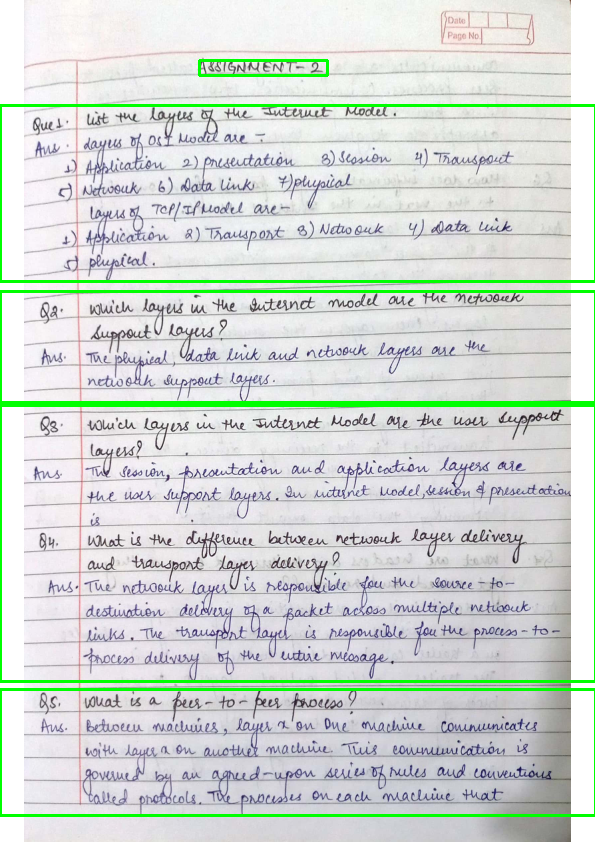

Processing image: /content/PDF_Images/page_5.png
Paragraph: (0, 52, 595, 229)
Paragraph: (0, 239, 595, 315)
Paragraph: (0, 341, 595, 512)
Paragraph: (0, 526, 595, 641)
Paragraph: (0, 643, 595, 698)
Paragraph: (0, 698, 595, 842)
Paragraph: (0, 698, 215, 711)
Cropped paragraph 1 saved at cropped_paragraphs/paragraph_1.jpg
Cropped paragraph 2 saved at cropped_paragraphs/paragraph_2.jpg
Cropped paragraph 3 saved at cropped_paragraphs/paragraph_3.jpg
Cropped paragraph 4 saved at cropped_paragraphs/paragraph_4.jpg
Cropped paragraph 5 saved at cropped_paragraphs/paragraph_5.jpg
Cropped paragraph 6 saved at cropped_paragraphs/paragraph_6.jpg
Cropped paragraph 7 saved at cropped_paragraphs/paragraph_7.jpg
Horizontal gap between paragraph 2 and 3: 26 pixels
Horizontal gap between paragraph 3 and 4: 14 pixels


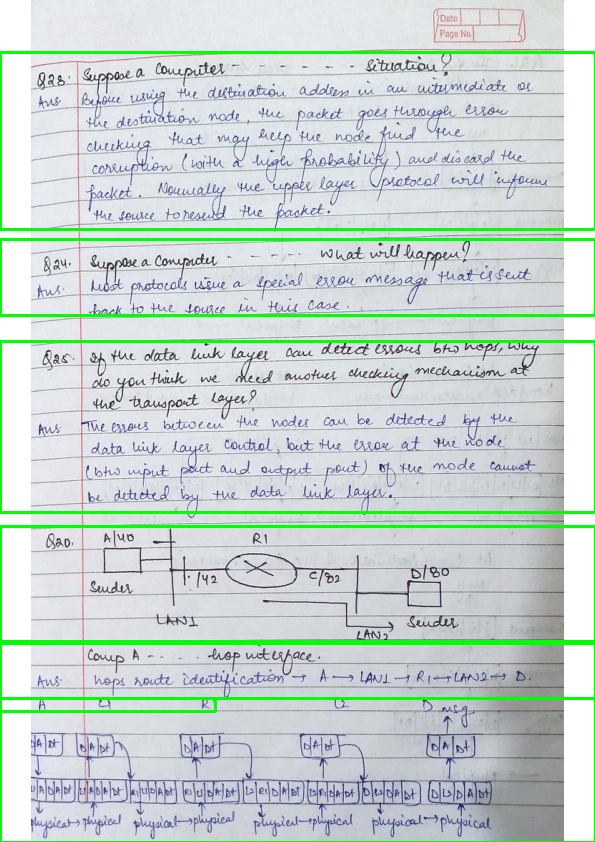

In [9]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow
import glob

def run_length_smoothing_algorithm(image, horizontal=True, vertical=True):
    """
    Applies Run Length Smoothing Algorithm (RLSA) to a binary image.

    Args:
        image (numpy.ndarray): A binary image (0 for background, 255 for text).
        horizontal (bool): Whether to apply smoothing horizontally.
        vertical (bool): Whether to apply smoothing vertically.

    Returns:
        numpy.ndarray: The smoothed binary image.
    """
    if horizontal:
        for row in image:
            rle = []  # Run-length encoding
            start = 0
            length = 1
            for i in range(1, len(row)):
                if row[i] == row[i - 1]:
                    length += 1
                else:
                    rle.append((start, length, row[i - 1]))
                    start = i
                    length = 1
            rle.append((start, length, row[-1]))

            for start, length, value in rle:
                if value == 0 and length < 100:  # Adjust threshold as needed
                    row[start: start + length] = 255

    if vertical:
        for col in image.T:
            rle = []  # Run-length encoding
            start = 0
            length = 1
            for i in range(1, len(col)):
                if col[i] == col[i - 1]:
                    length += 1
                else:
                    rle.append((start, length, col[i - 1]))
                    start = i
                    length = 1
            rle.append((start, length, col[-1]))

            for start, length, value in rle:
                if value == 0 and length < 10:  # Adjust threshold as needed
                    col[start: start + length] = 255

    return image

def detect_paragraphs_with_rlsa(image_path):
    """
    Detects paragraphs in an image using RLSA.

    Args:
        image_path (str): Path to the image file.

    Returns:
        list: A list of tuples, where each tuple contains the top-left and
              bottom-right coordinates of a detected paragraph.
    """
    # Load the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Threshold the image to create a binary image
    _, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)

    # Apply RLSA
    smoothed_image = run_length_smoothing_algorithm(thresh.copy())

    # Find contours
    contours, _ = cv2.findContours(smoothed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Get bounding boxes for each contour
    paragraphs = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if w * h > 1000:  # Adjust threshold as needed
            paragraphs.append((x, y, x + w, y + h))

    # Sort paragraphs by the y-coordinate to ensure top-to-bottom order
    paragraphs.sort(key=lambda box: box[1])

    return paragraphs

def save_cropped_paragraphs(image_path, paragraphs, output_folder="cropped_paragraphs"):
    """
    Saves the cropped paragraphs from the image as separate images in a specified folder.

    Args:
        image_path (str): Path to the original image.
        paragraphs (list): List of bounding box coordinates for the paragraphs.
        output_folder (str): Directory to save the cropped paragraph images.
    """
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Load the original image
    img = cv2.imread(image_path)

    # Iterate through paragraphs and save each one
    for i, paragraph in enumerate(paragraphs):
        x1, y1, x2, y2 = paragraph
        cropped_paragraph = img[y1:y2, x1:x2]

        # Save the cropped paragraph as an image file
        output_path = os.path.join(output_folder, f"paragraph_{i + 1}.jpg")
        cv2.imwrite(output_path, cropped_paragraph)

        print(f"Cropped paragraph {i + 1} saved at {output_path}")

# Example usage for processing images from PDF_Images folder
image_folder = "/content/PDF_Images"  # Path to the folder containing PDF page images

# Get a list of all image files in the folder
image_files = glob.glob(os.path.join(image_folder, '*.png'))

# Process each image
for image_path in image_files:
    print(f"Processing image: {image_path}")
    paragraphs = detect_paragraphs_with_rlsa(image_path)

    # Print the coordinates of the detected paragraphs
    for paragraph in paragraphs:
        print(f"Paragraph: {paragraph}")

    # Save cropped paragraphs
    save_cropped_paragraphs(image_path, paragraphs)

    # Draw bounding boxes and display the image
    img = cv2.imread(image_path)
    previous_bottom = 0
    for i, paragraph in enumerate(paragraphs):
        x1, y1, x2, y2 = paragraph
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Calculate horizontal gap
        if i > 0:
            horizontal_gap = y1 - previous_bottom
            if horizontal_gap > 10:  # Adjust threshold as needed
                print(f"Horizontal gap between paragraph {i} and {i + 1}: {horizontal_gap} pixels")
        previous_bottom = y2

    cv2_imshow(img)  # Display the image with bounding boxes
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# **Text Prediction pipelining model(HUGGINGFACE) model**

In [10]:
# test.py
import torch
from PIL import Image
from transformers import AutoModel, AutoTokenizer

model = AutoModel.from_pretrained('openbmb/MiniCPM-Llama3-V-2_5-int4', trust_remote_code=True)
tokenizer = AutoTokenizer.from_pretrained('openbmb/MiniCPM-Llama3-V-2_5-int4', trust_remote_code=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

configuration_minicpm.py:   0%|          | 0.00/4.06k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- configuration_minicpm.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_minicpmv.py:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

resampler.py:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- modeling_minicpmv.py
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now default to True since model is quantized.


model.safetensors.index.json:   0%|          | 0.00/244k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.65G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.51G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/50.9k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

MiniCPMV(
  (llm): LlamaForCausalLM(
    (model): LlamaModel(
      (embed_tokens): Embedding(128256, 4096)
      (layers): ModuleList(
        (0-31): 32 x LlamaDecoderLayer(
          (self_attn): LlamaSdpaAttention(
            (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
            (k_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
            (v_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
            (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
            (rotary_emb): LlamaRotaryEmbedding()
          )
          (mlp): LlamaMLP(
            (gate_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
            (up_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
            (down_proj): Linear4bit(in_features=14336, out_features=4096, bias=False)
            (act_fn): SiLU()
          )
          (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
      

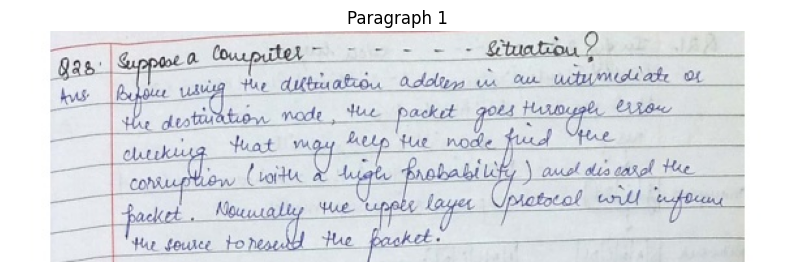

Extracted text from Paragraph 1:
228. Suppose a computer - situation?
ausing the destination address in an intermediary or
the destination node, the packet goes through error
checking. That may help the node find the
corruption (with a high probability) and discard the
packet. Normally the upper layer protocol will inform
the source to resend the packet.


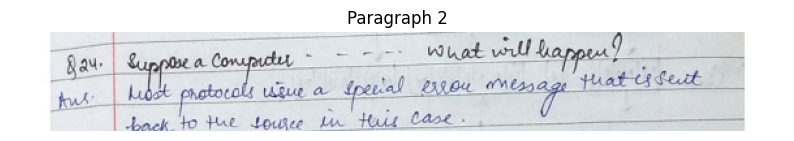

Extracted text from Paragraph 2:
8.24. Suppose a computer... -- what will happen? Aus. List protocols issue a special error message that is sent back to the source in this case.


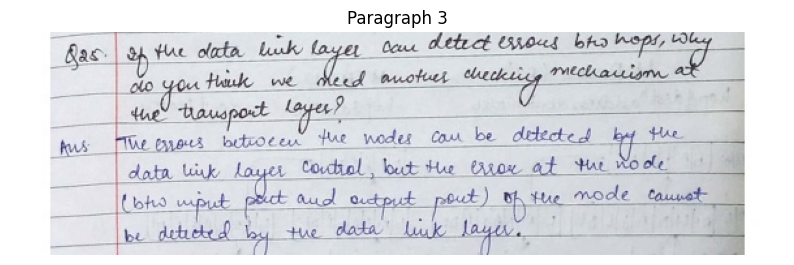

Extracted text from Paragraph 3:
QAS. Of the data link layer can detect errors, bros why, do you think we need another checking mechanism at the transport layer? The errors between the nodes can be detected by the data link layer control but the error at the node who (who input port and put out put) of the node cannot be detected by the data link layer.


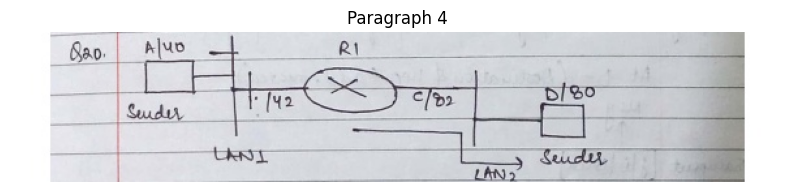

Extracted text from Paragraph 4:
S0.0 A/40 R1 C/82 1/42 D/80 Seuder Seuder LAN1 Seuder LAN2


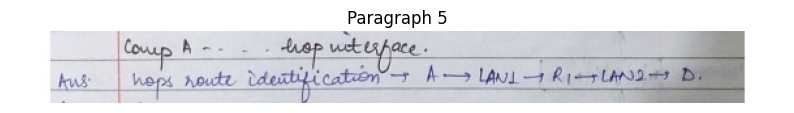

Extracted text from Paragraph 5:
Ans: hops route identification → A → LAN1 → R1 → LAN2 → D.


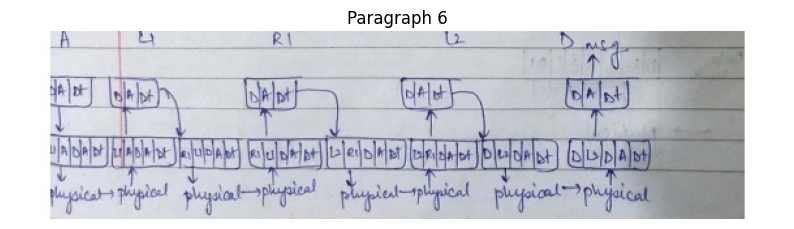

Extracted text from Paragraph 6:
A 4 R1 L2 D msg


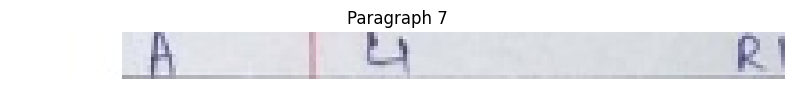

Extracted text from Paragraph 7:
A


In [11]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Directory where cropped paragraph images are stored (from previous code)
output_dir = '/content/cropped_paragraphs'

# Ensure the directory exists
if not os.path.exists(output_dir):
    raise FileNotFoundError(f"The directory {output_dir} does not exist.")

# Get a list of all image files in the directory
image_files = sorted([file for file in os.listdir(output_dir) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Check if there are any image files
if not image_files:
    raise FileNotFoundError("No image files found in the directory.")

# Iterate through each image file
for i, image_file in enumerate(image_files):
    # Construct full image path
    paragraph_img_path = os.path.join(output_dir, image_file)

    # Read image using OpenCV
    paragraph_img = cv2.imread(paragraph_img_path)

    if paragraph_img is not None:
        # Convert BGR image to RGB for display with matplotlib
        paragraph_img_rgb = cv2.cvtColor(paragraph_img, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.figure(figsize=(10, 5))
        plt.imshow(paragraph_img_rgb)
        plt.axis('off')
        plt.title(f'Paragraph {i+1}')
        plt.show()

        # Open image with PIL for model processing
        image = Image.open(paragraph_img_path).convert('RGB')

        # Prepare question for model
        question = 'Extract the text from the image. Just give only the image text.'
        msgs = [{'role': 'user', 'content': question}]

        # Call model's chat function to extract text (ensure model and tokenizer are initialized elsewhere)
        try:
            res = model.chat(
                image=image,
                msgs=msgs,
                tokenizer=tokenizer,
                sampling=True,
                temperature=0.7,
                system_prompt='You are an AI that extracts and transcribes text from images. Please read the text in the image and transcribe it accurately.'
            )
            # Print extracted text
            print(f"Extracted text from Paragraph {i+1}:")
            print(res)
        except Exception as e:
            print(f"Error processing image {paragraph_img_path}: {e}")

    else:
        print(f"Image {paragraph_img_path} could not be loaded.")


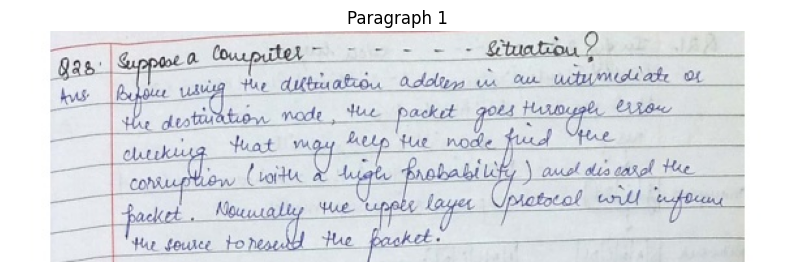

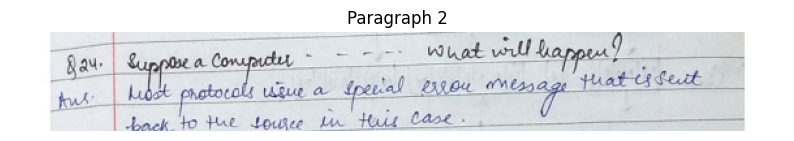

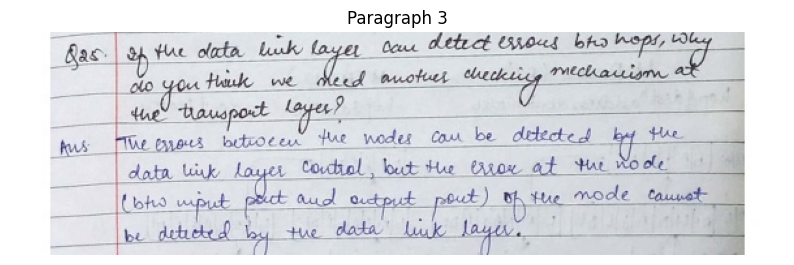

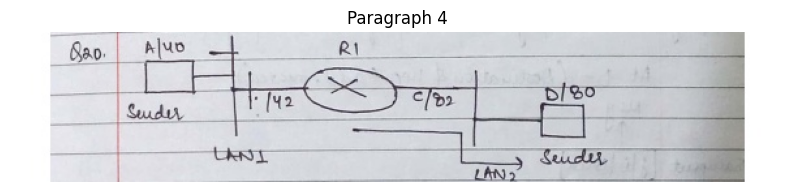

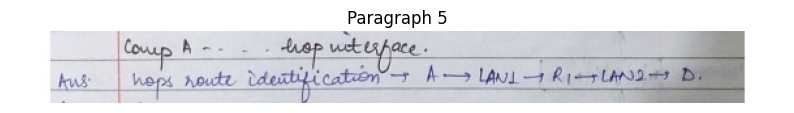

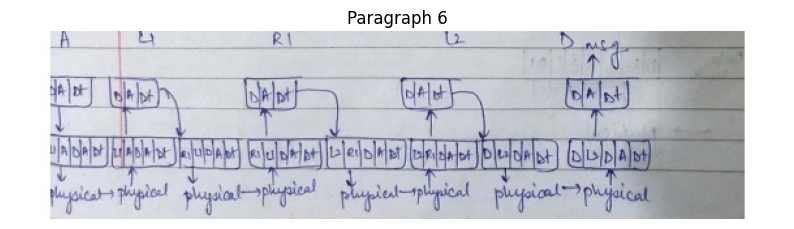

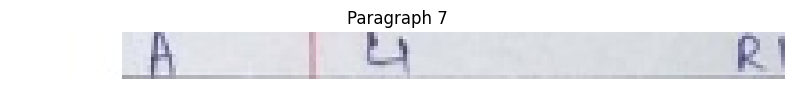

Extracted text has been saved to /content/extracted_texts.csv


In [12]:
# Code to Save in CSV File
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import csv

# Directory where paragraph images are stored
output_dir = '/content/cropped_paragraphs'

# Output CSV file path
csv_file_path = '/content/extracted_texts.csv'

# Ensure the directory exists
if not os.path.exists(output_dir):
    raise FileNotFoundError(f"The directory {output_dir} does not exist.")

# Get a list of all image files in the directory
image_files = sorted([file for file in os.listdir(output_dir) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Check if there are any image files
if not image_files:
    raise FileNotFoundError("No image files found in the directory.")

# List to store extracted text data
extracted_texts = []

# Iterate through each image file
for i, image_file in enumerate(image_files):
    # Construct full image path
    paragraph_img_path = os.path.join(output_dir, image_file)

    # Read image using OpenCV
    paragraph_img = cv2.imread(paragraph_img_path)

    if paragraph_img is not None:
        # Convert BGR image to RGB
        paragraph_img_rgb = cv2.cvtColor(paragraph_img, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.figure(figsize=(10, 5))
        plt.imshow(paragraph_img_rgb)
        plt.axis('off')
        plt.title(f'Paragraph {i+1}')
        plt.show()

        # Open image with PIL for model processing
        image = Image.open(paragraph_img_path).convert('RGB')

        # Prepare question for model
        question = 'Extract the text from the image. Just give only the image text.'
        msgs = [{'role': 'user', 'content': question}]

        # Call model's chat function to extract text
        # Make sure `model`, `tokenizer` are defined elsewhere in your code
        try:
            res = model.chat(
                image=image,
                msgs=msgs,
                tokenizer=tokenizer,
                sampling=True,
                temperature=0.7,
                system_prompt='You are an AI that extracts and transcribes text from images. Please read the text in the image and transcribe it accurately.'
            )
            # Store the extracted text
            extracted_texts.append([f'Paragraph {i+1}', res])
        except Exception as e:
            extracted_texts.append([f'Paragraph {i+1}', f"Error: {e}"])
            print(f"Error processing image {paragraph_img_path}: {e}")

    else:
        extracted_texts.append([f'Paragraph {i+1}', "Error: Image not loaded"])
        print(f"Image {paragraph_img_path} could not be loaded.")

# Write the extracted text to a CSV file
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    # Write the header
    writer.writerow(['Paragraph', 'Extracted Text'])
    # Write the rows
    writer.writerows(extracted_texts)

print(f"Extracted text has been saved to {csv_file_path}")


In [ ]:
## END ##